#PART - 1 FACE DETECTION

#### 1. Install TensorFlow Object Detection API

In [1]:
#Clone githun repository
!git clone https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 67857, done.
remote: Counting objects: 100% (23/23), done.
remote: Compressing objects: 100% (17/17), done.
remote: Total 67857 (delta 9), reused 17 (delta 6), pack-reused 67834
Receiving objects: 100% (67857/67857), 576.41 MiB | 35.85 MiB/s, done.
Resolving deltas: 100% (47654/47654), done.


In [2]:
#Upgrade pip package
!pip install --upgrade pip

     |████████████████████████████████| 1.7 MB 7.7 MB/s 
  Attempting uninstall: pip
    Found existing installation: pip 21.1.3
    Uninstalling pip-21.1.3:
      Successfully uninstalled pip-21.1.3


In [3]:
%%bash
cd models/research
# Compile protos.
protoc object_detection/protos/*.proto --python_out=.
# Install TensorFlow Object Detection API.
cp object_detection/packages/tf2/setup.py .
python -m pip install --use-feature=2020-resolver .

Processing /content/models/research
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for object-detection: filename=object_detection-0.1-py3-none-any.whl size=21904327 sha256=638e451dda5e2294d5faf58c178e425f1f8369387652969ba06f4c9d4e72cb58
  Stored in directory: /tmp/pip-ephem-wheel-cache-e46wn4s_/wheels/fa/a4/d2/e9a5

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
multiprocess 0.70.12.2 requires dill>=0.3.4, but you have dill 0.3.1.1 which is incompatible.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.26.0 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.


In [4]:
#Check if Object Detection API is installed
!pip list | grep object-detection

object-detection              0.1


### 2. Download Dataset

In [5]:
#Come to the home directory
%cd /content

/content


In [6]:
#Create a folder for your project e.g in this case, detection. You can choose any name for the folder 
!mkdir object_detection

#Go to the project folder
%cd object_detection

/content/object_detection


In [7]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [8]:
!sudo cp -v -r "/content/drive/MyDrive/Colab Notebooks/Part 1- Train data - images.npy" "/content/object_detection/"

'/content/drive/MyDrive/Colab Notebooks/Part 1- Train data - images.npy' -> '/content/object_detection/Part 1- Train data - images.npy'


In [9]:
data_path = '/content/detection/Part 1- Train data - images.npy'

In [10]:
import numpy as np

In [11]:
images = np.load(data_path, allow_pickle=True)

In [12]:
images.shape

(409, 2)

In [13]:
import pandas as pd

In [14]:
images_df = pd.DataFrame(images)
images_df = images_df.rename(columns={0 : 'images',
                                      1 : 'annotations'})
images_df

,images,annotations
0,"[[[42, 37, 34], [56, 51, 48], [71, 66, 63], [7...","[{'label': ['Face'], 'notes': '', 'points': [{..."
1,"[[[207, 216, 227, 255], [206, 216, 227, 255], ...","[{'label': ['Face'], 'notes': '', 'points': [{..."
2,"[[[91, 61, 33], [95, 65, 37], [94, 64, 38], [9...","[{'label': ['Face'], 'notes': '', 'points': [{..."
3,"[[[0, 0, 0, 255], [0, 0, 0, 255], [0, 0, 0, 25...","[{'label': ['Face'], 'notes': '', 'points': [{..."
4,"[[[250, 250, 250], [250, 250, 250], [250, 250,...","[{'label': ['Face'], 'notes': '', 'points': [{..."
...,...,...
404,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ...","[{'label': ['Face'], 'notes': '', 'points': [{..."
405,"[[[21, 36, 17], [21, 36, 17], [21, 36, 17], [2...","[{'label': ['Face'], 'notes': '', 'points': [{..."
406,"[[[2, 2, 4], [1, 2, 4], [1, 2, 4], [2, 3, 5], ...","[{'label': ['Face'], 'notes': '', 'points': [{..."
407,"[[[20, 4, 4], [20, 4, 4], [20, 4, 4], [20, 4, ...","[{'label': ['Face'], 'notes': '', 'points': [{..."


In [15]:
import PIL.Image as Image

In [16]:
image_path = "/content/object_detection/Img_data"

In [17]:
dataset = []

for index,row in images_df.iterrows():
  img = images_df['images'][index]
  img = Image.fromarray(img)
  img = img.convert('RGB')
  image_name = f'face_{index}.jpeg'  
  img.save(image_path + f'/{image_name}', "JPEG")

  annotations = row['annotations']
  for i in annotations:
    
    width = i['imageWidth']
    height = i['imageHeight']
    points = i['points']
    
    data = {}
    
    data['filename'] = image_name
    data['width'] = width
    data['height'] = height
    
    data["xmin"] = int(round(points[0]["x"] * width))
    data["ymin"] = int(round(points[0]["y"] * height))
    data["xmax"] = int(round(points[1]["x"] * width))
    data["ymax"] = int(round(points[1]["y"] * height))
    
    data['class'] = 'Face'
    
    dataset.append(data)   

In [18]:
df = pd.DataFrame(dataset)
df

,filename,width,height,xmin,ymin,xmax,ymax,class
0,face_0.jpeg,650,333,56,102,112,151,Face
1,face_0.jpeg,650,333,379,97,428,156,Face
2,face_1.jpeg,1280,697,903,162,985,252,Face
3,face_2.jpeg,460,240,216,12,279,80,Face
4,face_2.jpeg,460,240,289,2,343,74,Face
...,...,...,...,...,...,...,...,...
1127,face_408.jpeg,656,493,164,122,187,150,Face
1128,face_408.jpeg,656,493,318,115,346,159,Face
1129,face_408.jpeg,656,493,389,156,407,177,Face
1130,face_408.jpeg,656,493,507,204,526,226,Face


In [19]:
df.to_csv('detection_data.csv',index=False)

In [20]:
df = pd.read_csv('detection_data.csv')
df.head(5)

,filename,width,height,xmin,ymin,xmax,ymax,class
0,face_0.jpeg,650,333,56,102,112,151,Face
1,face_0.jpeg,650,333,379,97,428,156,Face
2,face_1.jpeg,1280,697,903,162,985,252,Face
3,face_2.jpeg,460,240,216,12,279,80,Face
4,face_2.jpeg,460,240,289,2,343,74,Face


In [21]:
#How many object across all images
df.shape

(1132, 8)

In [22]:
#List of labels
df['class'].unique()

array(['Face'], dtype=object)

In [23]:
#Number of labels
len(df['class'].unique())

1

Label encode classes
(This step is optional as we have just one class)

In [24]:
#Use Label encoder available in Scikit Learn
from sklearn import preprocessing

In [25]:
#Label Encode class and add a 'label' column to the dataframe
le = preprocessing.LabelEncoder()
df['label'] = le.fit_transform(df['class'])
df.head()

,filename,width,height,xmin,ymin,xmax,ymax,class,label
0,face_0.jpeg,650,333,56,102,112,151,Face,0
1,face_0.jpeg,650,333,379,97,428,156,Face,0
2,face_1.jpeg,1280,697,903,162,985,252,Face,0
3,face_2.jpeg,460,240,216,12,279,80,Face,0
4,face_2.jpeg,460,240,289,2,343,74,Face,0


In [26]:
#unique values in the label
df.label.unique()

array([0])

In [27]:
#Object detection API expects index to start from 1 (and not 0)
df['label'] = df['label'] + 1
df.label.unique()

array([1])

In [28]:
#Dataframe should have label column now
df.head()

,filename,width,height,xmin,ymin,xmax,ymax,class,label
0,face_0.jpeg,650,333,56,102,112,151,Face,1
1,face_0.jpeg,650,333,379,97,428,156,Face,1
2,face_1.jpeg,1280,697,903,162,985,252,Face,1
3,face_2.jpeg,460,240,216,12,279,80,Face,1
4,face_2.jpeg,460,240,289,2,343,74,Face,1


In [29]:
#Create a dictionary of Label and Class. This will be useful for building our second input to Model training
label_class_dict = dict(zip(df['label'], df['class']))
print(label_class_dict)

{1: 'Face'}


**Split data between training and test**

First we have to split images between training and test. Then we can use that information to split dataframe between training and test. This will make sure objects from same image are not split between training and test.

In [30]:
#Get information on all images
all_classes = df['filename'].unique()
all_classes.shape

(409,)

In [31]:
#80% of the data will be used for training
mask = np.random.rand(all_classes.shape[0]) < 0.8

#Get Training and Test images
train_images = all_classes[mask]
test_images = all_classes[~mask] 

In [32]:
#Check number of images in training and test
train_images.shape, test_images.shape

((333,), (76,))

In [33]:
train_images[:10]

array(['face_1.jpeg', 'face_4.jpeg', 'face_5.jpeg', 'face_7.jpeg',
       'face_8.jpeg', 'face_10.jpeg', 'face_11.jpeg', 'face_12.jpeg',
       'face_13.jpeg', 'face_14.jpeg'], dtype=object)

In [34]:
#Split dataframe between training and test
train_df = df[df['filename'].isin(train_images)]
test_df = df[df['filename'].isin(test_images)]

In [35]:
train_df

,filename,width,height,xmin,ymin,xmax,ymax,class,label
2,face_1.jpeg,1280,697,903,162,985,252,Face,1
6,face_4.jpeg,580,326,324,65,383,123,Face,1
7,face_4.jpeg,580,326,224,61,284,132,Face,1
8,face_4.jpeg,580,326,100,75,161,144,Face,1
9,face_4.jpeg,580,326,415,65,490,135,Face,1
...,...,...,...,...,...,...,...,...,...
1127,face_408.jpeg,656,493,164,122,187,150,Face,1
1128,face_408.jpeg,656,493,318,115,346,159,Face,1
1129,face_408.jpeg,656,493,389,156,407,177,Face,1
1130,face_408.jpeg,656,493,507,204,526,226,Face,1


In [36]:
train_df.shape, test_df.shape

((922, 9), (210, 9))

**Visualizing the data**

In [37]:
#We will use opencv and matplotlib
from matplotlib import pyplot as plt
import cv2

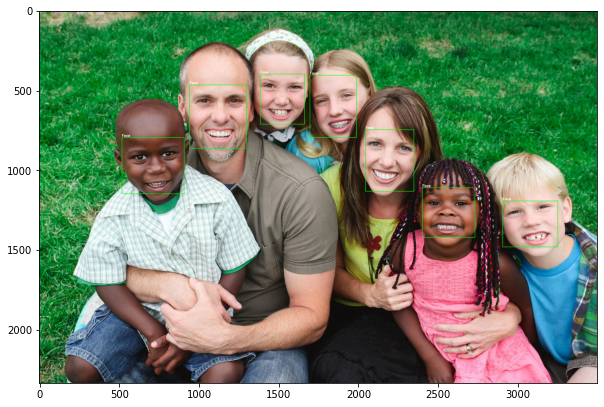

In [38]:
#Pickup a random image number
img_num = np.random.randint(0, df.shape[0])

#Read the image
img_file = df.loc[img_num,'filename']
img = cv2.imread(image_path + '/' + img_file)

#Find all rows which have same file name
rows_with_file = df[df['filename'] == img_file].index.tolist()

#Draw rectangle(s) as per bounding box information
for i in rows_with_file:

    #Get bounding box
    xmin, ymin, xmax, ymax = df.loc[i, ['xmin', 'ymin', 'xmax', 'ymax']]
    #Get Label
    label = df.loc[i, 'class']
    #Add bounding box
    cv2.rectangle(img, (xmin,ymin), (xmax, ymax), (0,255,0), 2)
    #Add text
    cv2.putText(img,label,(xmin, ymin-5),cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 2)

#Convert BGR format (used by opencv to RGB format used by matplotlib)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

#Draw image using matplotlib
plt.figure(figsize=(10,7))
plt.imshow(img)
plt.show()

Saving training and test as csv

In [39]:
train_df.to_csv('train.csv', index=False)
test_df.to_csv('test.csv', index=False)

In [40]:
#We should have training and test csv files in current directory
!ls -l

total 1325268
-rw-r--r-- 1 root root      48703 Dec 10 08:21  detection_data.csv
-rw-r--r-- 1 root root       4465 Dec 10 08:18  generate_tfrecord.py
drwxr-xr-x 2 root root      20480 Dec 10 08:21  Img_data
-r-------- 1 root root 1356868279 Dec 10 08:17 'Part 1- Train data - images.npy'
-rw-r--r-- 1 root root      52325 Dec 10 08:19 'Prediction Image.jpeg'
-rw-r--r-- 1 root root       4361 Dec 10 08:18  ssd_mobilenet_v2_modified.config
-rw-r--r-- 1 root root       9460 Dec 10 08:21  test.csv
-rw-r--r-- 1 root root      41567 Dec 10 08:21  train.csv


In [41]:
#generate tfrecord for training data
!python generate_tfrecord.py --csv_input=train.csv  --img_path={image_path} --output_path=train.tfrecord

Successfully created the TFRecords: /content/object_detection/train.tfrecord


In [42]:
#generate tfrecord for test data
!python generate_tfrecord.py --csv_input=test.csv  --img_path={image_path} --output_path=test.tfrecord

Successfully created the TFRecords: /content/object_detection/test.tfrecord


In [43]:
#train.record and test.record files should be available now
!ls -l

total 1374712
-rw-r--r-- 1 root root      48703 Dec 10 08:21  detection_data.csv
-rw-r--r-- 1 root root       4465 Dec 10 08:18  generate_tfrecord.py
drwxr-xr-x 2 root root      20480 Dec 10 08:21  Img_data
-r-------- 1 root root 1356868279 Dec 10 08:17 'Part 1- Train data - images.npy'
-rw-r--r-- 1 root root      52325 Dec 10 08:19 'Prediction Image.jpeg'
-rw-r--r-- 1 root root       4361 Dec 10 08:18  ssd_mobilenet_v2_modified.config
-rw-r--r-- 1 root root       9460 Dec 10 08:21  test.csv
-rw-r--r-- 1 root root   10351778 Dec 10 08:21  test.tfrecord
-rw-r--r-- 1 root root      41567 Dec 10 08:21  train.csv
-rw-r--r-- 1 root root   40275663 Dec 10 08:21  train.tfrecord


### 5. Create Label Mapping file

In [44]:
#Dict which was created earlier will be used for building Label Mapping file
label_class_dict

{1: 'Face'}

In [45]:
#Build a pbtxt label file using label and class name
#This is required by Object detection API
#You can prepare it manually as well.

pbtxt_file_txt = ''
for label in sorted(label_class_dict.keys()):
    
    pbtxt_file_txt += "item {\n  id: " + str(label) + "\n  name: '" +  label_class_dict[label] + "'\n}\n\n"

with open('label_map.txt','w') as pbfile:
    pbfile.write(pbtxt_file_txt)

In [46]:
!ls -l

total 1374716
-rw-r--r-- 1 root root      48703 Dec 10 08:21  detection_data.csv
-rw-r--r-- 1 root root       4465 Dec 10 08:18  generate_tfrecord.py
drwxr-xr-x 2 root root      20480 Dec 10 08:21  Img_data
-rw-r--r-- 1 root root         33 Dec 10 08:21  label_map.txt
-r-------- 1 root root 1356868279 Dec 10 08:17 'Part 1- Train data - images.npy'
-rw-r--r-- 1 root root      52325 Dec 10 08:19 'Prediction Image.jpeg'
-rw-r--r-- 1 root root       4361 Dec 10 08:18  ssd_mobilenet_v2_modified.config
-rw-r--r-- 1 root root       9460 Dec 10 08:21  test.csv
-rw-r--r-- 1 root root   10351778 Dec 10 08:21  test.tfrecord
-rw-r--r-- 1 root root      41567 Dec 10 08:21  train.csv
-rw-r--r-- 1 root root   40275663 Dec 10 08:21  train.tfrecord


In [47]:
#Review the file content
!cat label_map.txt

item {
  id: 1
  name: 'Face'
}



### 6. Download a pre trained model

In [48]:
#Download the model from zoo
!wget -q http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz

In [49]:
!ls -l

total 1419680
-rw-r--r-- 1 root root      48703 Dec 10 08:21  detection_data.csv
-rw-r--r-- 1 root root       4465 Dec 10 08:18  generate_tfrecord.py
drwxr-xr-x 2 root root      20480 Dec 10 08:21  Img_data
-rw-r--r-- 1 root root         33 Dec 10 08:21  label_map.txt
-r-------- 1 root root 1356868279 Dec 10 08:17 'Part 1- Train data - images.npy'
-rw-r--r-- 1 root root      52325 Dec 10 08:19 'Prediction Image.jpeg'
-rw-r--r-- 1 root root   46042990 Jul 11  2020  ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz
-rw-r--r-- 1 root root       4361 Dec 10 08:18  ssd_mobilenet_v2_modified.config
-rw-r--r-- 1 root root       9460 Dec 10 08:21  test.csv
-rw-r--r-- 1 root root   10351778 Dec 10 08:21  test.tfrecord
-rw-r--r-- 1 root root      41567 Dec 10 08:21  train.csv
-rw-r--r-- 1 root root   40275663 Dec 10 08:21  train.tfrecord


In [50]:
#Extract tar file content
!tar -xf ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz

In [51]:
!ls -l

total 1419684
-rw-r--r-- 1 root   root       48703 Dec 10 08:21  detection_data.csv
-rw-r--r-- 1 root   root        4465 Dec 10 08:18  generate_tfrecord.py
drwxr-xr-x 2 root   root       20480 Dec 10 08:21  Img_data
-rw-r--r-- 1 root   root          33 Dec 10 08:21  label_map.txt
-r-------- 1 root   root  1356868279 Dec 10 08:17 'Part 1- Train data - images.npy'
-rw-r--r-- 1 root   root       52325 Dec 10 08:19 'Prediction Image.jpeg'
drwxr-x--- 4 345018 89939       4096 Jul 11  2020  ssd_mobilenet_v2_320x320_coco17_tpu-8
-rw-r--r-- 1 root   root    46042990 Jul 11  2020  ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz
-rw-r--r-- 1 root   root        4361 Dec 10 08:18  ssd_mobilenet_v2_modified.config
-rw-r--r-- 1 root   root        9460 Dec 10 08:21  test.csv
-rw-r--r-- 1 root   root    10351778 Dec 10 08:21  test.tfrecord
-rw-r--r-- 1 root   root       41567 Dec 10 08:21  train.csv
-rw-r--r-- 1 root   root    40275663 Dec 10 08:21  train.tfrecord


In [52]:
#Check the extracted folder
!ls -l ssd_mobilenet_v2_320x320_coco17_tpu-8

total 16
drwxr-x--- 2 345018 89939 4096 Jul 10  2020 checkpoint
-rw-r----- 1 345018 89939 4496 Jul 11  2020 pipeline.config
drwxr-x--- 3 345018 89939 4096 Jul 10  2020 saved_model


In [53]:
#Check the extracted folder
!ls -l ssd_mobilenet_v2_320x320_coco17_tpu-8/checkpoint

total 23924
-rw-r----- 1 345018 89939      166 Jul 10  2020 checkpoint
-rw-r----- 1 345018 89939 24484350 Jul 10  2020 ckpt-0.data-00000-of-00001
-rw-r----- 1 345018 89939     6121 Jul 10  2020 ckpt-0.index


### 7. Prepare Training configuration file

1. Change num_classes parameter to 1 (as we have only 1 category in pascal voc dataset)
2. For 'train_input_reader' change 'input_path' to filepath of train.record file.
3. For 'train_input_reader' change 'label_map_path' to filepath of pascal_voc.pbtxt file.
4. Repeat above two steps for 'eval_input_reader'.
5. Change fine_tune_checkpoint to filepath where pre-trained model.ckpt file is available e.g ssd_mobilenet_v1_coco_2018_01_28/model.ckpt
6. Change 'batch_size' accordingly to available memory.
7. Change 'num_steps' to indicate how long the training will done e.g. 200000. For demo purpose, we are keeping it to 20 so that we can finish training quickly.


In [54]:
!cat  ssd_mobilenet_v2_modified.config

# SSD with Mobilenet v2
# Trained on COCO17, initialized from Imagenet classification checkpoint
# Train on TPU-8
#
# Achieves 22.2 mAP on COCO17 Val

model {
  ssd {
    inplace_batchnorm_update: true
    freeze_batchnorm: false
    num_classes: 1
    box_coder {
      faster_rcnn_box_coder {
        y_scale: 10.0
        x_scale: 10.0
        height_scale: 5.0
        width_scale: 5.0
      }
    }
    matcher {
      argmax_matcher {
        matched_threshold: 0.5
        unmatched_threshold: 0.5
        ignore_thresholds: false
        negatives_lower_than_unmatched: true
        force_match_for_each_row: true
        use_matmul_gather: true
      }
    }
    similarity_calculator {
      iou_similarity {
      }
    }
    encode_background_as_zeros: true
    anchor_generator {
      ssd_anchor_generator {
        num_layers: 6
        min_scale: 0.2
        max_scale: 0.95
        aspect_ratios: 1.0
        aspect_ratios: 2.0
        aspect_ratios: 0.5
        aspect_ratios: 3.0
 

In [55]:
config_file = 'ssd_mobilenet_v2_modified.config'

In [63]:
#Copy training file from 'models/research/object_detection' folder to current folder
!cp /content/models/research/object_detection/model_main_tf2.py .

Start training 

- Please note that Object detection take long time to train. The training may take few days if run on single GPU machine (depending on num of steps indicated). Try to keep training the model till loss comes close to 1 (or goes below 1). The script takes 3 inputs

1. --train_dir=<folder_name> : where model will be saved periodically as training progresses
2. --pipeline_config_path=<config_file_path> :where is model training configuration file located.

In [64]:
#Create a training folder to store model checkpoints/snapshots as training progresses
!mkdir training

mkdir: cannot create directory ‘training’: File exists


In [65]:
#Check training folder
!ls -l training

total 0


### Start Tensorboard

In [66]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [67]:
%tensorboard --logdir training

Reusing TensorBoard on port 6007 (pid 913), started 0:02:05 ago. (Use '!kill 913' to kill it.)

<IPython.core.display.Javascript object>

In [68]:
#start training
!python model_main_tf2.py --model_dir=training/ --pipeline_config_path={config_file} --checkpoint_every_n=100 --alsologtostderr

2021-12-10 08:24:56.275848: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:39] Overriding allow_growth setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
I1210 08:24:56.280048 139839685269376 mirrored_strategy.py:376] Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
INFO:tensorflow:Maybe overwriting train_steps: None
I1210 08:24:56.285069 139839685269376 config_util.py:552] Maybe overwriting train_steps: None
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I1210 08:24:56.285191 139839685269376 config_util.py:552] Maybe overwriting use_bfloat16: False
Instructions for updating:
rename to distribute_datasets_from_function
W1210 08:24:56.344401 139839685269376 deprecation.py:347] From /usr/local/lib/python3.7/dist-packages/object_detection/model_lib_v2.py:564: StrategyBase.experiment

Model Evaluation


In [69]:
#start Evaluation - THIS WILL KEEP RUNNING.
!python model_main_tf2.py --model_dir=training/ --pipeline_config_path={config_file} --checkpoint_dir=training/ --alsologtostderr 

W1210 08:41:44.364859 139775813277568 model_lib_v2.py:1090] Forced number of epochs for all eval validations to be 1.
INFO:tensorflow:Maybe overwriting sample_1_of_n_eval_examples: None
I1210 08:41:44.365124 139775813277568 config_util.py:552] Maybe overwriting sample_1_of_n_eval_examples: None
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I1210 08:41:44.365230 139775813277568 config_util.py:552] Maybe overwriting use_bfloat16: False
INFO:tensorflow:Maybe overwriting eval_num_epochs: 1
I1210 08:41:44.365318 139775813277568 config_util.py:552] Maybe overwriting eval_num_epochs: 1
W1210 08:41:44.365466 139775813277568 model_lib_v2.py:1111] Expected number of evaluation epochs is 1, but instead encountered `eval_on_train_input_config.num_epochs` = 0. Overwriting `num_epochs` to 1.
2021-12-10 08:41:45.073954: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:39] Overriding allow_growth setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original confi

### 9. Export Trained Model
From the saved model checkpoints, we will create a frozen trained model. Frozen here means to remove model nodes which are no longer needed in prediction. This reduces model size.

In [71]:
#Copy export_inference_graph.py file from models/research/object_detection to current directory
!cp /content/models/research/object_detection/exporter_main_v2.py .

In [72]:
!ls -l

total 1419704
-rw-r--r-- 1 root   root       48703 Dec 10 08:21  detection_data.csv
-rw-r--r-- 1 root   root        7605 Dec 10 08:48  exporter_main_v2.py
-rw-r--r-- 1 root   root        4465 Dec 10 08:18  generate_tfrecord.py
drwxr-xr-x 2 root   root       20480 Dec 10 08:21  Img_data
-rw-r--r-- 1 root   root          33 Dec 10 08:21  label_map.txt
-rw-r--r-- 1 root   root        4937 Dec 10 08:24  model_main_tf2.py
-r-------- 1 root   root  1356868279 Dec 10 08:17 'Part 1- Train data - images.npy'
-rw-r--r-- 1 root   root       52325 Dec 10 08:19 'Prediction Image.jpeg'
drwxr-x--- 4 345018 89939       4096 Jul 11  2020  ssd_mobilenet_v2_320x320_coco17_tpu-8
-rw-r--r-- 1 root   root    46042990 Jul 11  2020  ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz
-rw-r--r-- 1 root   root        4361 Dec 10 08:18  ssd_mobilenet_v2_modified.config
-rw-r--r-- 1 root   root        9460 Dec 10 08:21  test.csv
-rw-r--r-- 1 root   root    10351778 Dec 10 08:21  test.tfrecord
-rw-r--r-- 1 root   root   

The export_inference_graph.py script file requires the following input:

1. --input_type <input_node_name> : This will be used during prediction to set model input
2. --pipeline_config_path <model_training_config_file_path> : where is model training config file located.
3. --trained_checkpoint_prefix <file_path__model_checkpoint> : Which checkpoint should be used to create final model.
4. --output_directory <frozen_model_directory> : where should the frozen model created by script should be stored.

In [73]:
#Provide input name, config file location, training folder
!python exporter_main_v2.py --input_type "image_tensor" --pipeline_config_path {config_file} --trained_checkpoint_dir training/ --output_directory detection_model

2021-12-10 08:48:39.968878: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:39] Overriding allow_growth setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
Instructions for updating:
back_prop=False is deprecated. Consider using tf.stop_gradient instead.
Instead of:
results = tf.map_fn(fn, elems, back_prop=False)
Use:
results = tf.nest.map_structure(tf.stop_gradient, tf.map_fn(fn, elems))
W1210 08:48:40.266821 140103600633728 deprecation.py:619] From /usr/local/lib/python3.7/dist-packages/tensorflow/python/autograph/impl/api.py:464: calling map_fn_v2 (from tensorflow.python.ops.map_fn) with back_prop=False is deprecated and will be removed in a future version.
Instructions for updating:
back_prop=False is deprecated. Consider using tf.stop_gradient instead.
Instead of:
results = tf.map_fn(fn, elems, back_prop=False)
Use:
results = tf.nest.map_structure(tf.stop_gradient, tf.map_fn(fn, elems))
INFO:tensorflow:depth of addition

In [74]:
#Check if model is saved in current directory
!ls -l detection_model

total 16
drwxr-xr-x 2 root root 4096 Dec 10 08:48 checkpoint
-rw-r--r-- 1 root root 4187 Dec 10 08:49 pipeline.config
drwxr-xr-x 4 root root 4096 Dec 10 08:49 saved_model


In [75]:
#Check if model is saved in current directory
!ls -l detection_model/saved_model

total 7008
drwxr-xr-x 2 root root    4096 Dec 10 08:49 assets
-rw-r--r-- 1 root root 7167174 Dec 10 08:49 saved_model.pb
drwxr-xr-x 2 root root    4096 Dec 10 08:49 variables


In [76]:
!ls -l detection_model/saved_model/variables/

total 18308
-rw-r--r-- 1 root root 18725071 Dec 10 08:49 variables.data-00000-of-00001
-rw-r--r-- 1 root root    18823 Dec 10 08:49 variables.index


In [77]:
!ls -l detection_model/saved_model/assets

total 0


Move the trained model to google drive

In [78]:
!cp -r detection_model '/content/drive/MyDrive/AI-ML/models/pascal_voc_tf2/' 

Save label dictionary as well for model prediction

In [79]:
print(label_class_dict)

{1: 'Face'}


In [80]:
import pickle

label_file_path = '/content/drive/MyDrive/AI-ML/models/pascal_voc_tf2/pascal_voc_label.pkl'

with open(label_file_path,'wb') as file:
    pickle.dump(label_class_dict, file)

### 10. Model Prediction

In [81]:
import tensorflow as tf

Load the saved model

In [82]:
saved_model_path = 'detection_model/saved_model'
model = tf.saved_model.load(saved_model_path)

Function to get model prediction

In [83]:
#Function to get predictions from a Detection model
def detector_prediction(image_file, confidence_threshold=0.5):

    """
    image_file: File path of the image for which prediction needs to be done
    confidence_threshold: Minimum confidence/probability for prediction to be considered
    """
    #Load image
    img = tf.keras.preprocessing.image.load_img(image_file)
    
    #Convert to numpy array
    img_array = tf.keras.preprocessing.image.img_to_array(img).astype('uint8')
    #Make it a batch of one example
    img_array = tf.expand_dims(img_array, axis=0)

    #Prediction
    output = model(img_array) #get list of tensors discussed above as output
    #print(output)
    detection_scores = output['detection_scores'].numpy()[0] #get detection scores
    detection_classes = output['detection_classes'].numpy()[0]
    detection_boxes = output['detection_boxes'].numpy()[0]

    #Select predictions for which probability is higher than confidence_threshold
    selected_predictions = detection_scores >= confidence_threshold

    selected_prediction_scores = detection_scores[selected_predictions]
    selected_prediction_classes = detection_classes[selected_predictions]
    selected_prediction_boxes = detection_boxes[selected_predictions]

    #De-normalize box co-ordinates (multiply x-coordinates by image width and y-coords by image height)
    img_w, img_h = img.size

    for i in range(selected_prediction_boxes.shape[0]):
        
        selected_prediction_boxes[i,0] *= img_h #ymin * img_w
        selected_prediction_boxes[i,1] *= img_w #xmin * img_h
        selected_prediction_boxes[i,2] *= img_h #ymax * img_w
        selected_prediction_boxes[i,3] *= img_w #xmax * img_h

    #Make all co-ordinates as integer
    selected_prediction_boxes= selected_prediction_boxes.astype(int)

    #Convert class indexes to actual class labels
    predicted_classes = []
    for i in range(selected_prediction_classes.shape[0]):
        predicted_classes.append(label_class_dict[int(selected_prediction_classes[i])])

    #Number of predictions
    selected_num_predictions = selected_prediction_boxes.shape[0]

    return {'Total Predictions': selected_num_predictions,
            'Scores': selected_prediction_scores, 
            'Classes': predicted_classes, 
            'Box coordinates': selected_prediction_boxes}

In [84]:
#Model output
detector_prediction('Prediction Image.jpeg', confidence_threshold=0.6)

{'Box coordinates': array([[263, 187, 382, 268],
        [ 19, 246, 125, 331]]),
 'Classes': ['Face', 'Face'],
 'Scores': array([0.69789064, 0.63952976], dtype=float32),
 'Total Predictions': 2}

Visualize model output

In [85]:
def visualize_output(image_file, confidence_threshold=0.5):

    #Call model prediction function above
    output = detector_prediction(image_file, confidence_threshold=confidence_threshold)

    #Read image
    img = cv2.imread(image_file)

    #Draw rectangle for predicted boxes, also add predicted classes
    for i in range(output['Box coordinates'].shape[0]):

        box = output['Box coordinates'][i]
        
        #Draw rectangle - (ymin, xmin, ymax, xmax)
        img = cv2.rectangle(img, (box[1], box[0]), (box[3], box[2]), (0,255,0), 2)
        
        #Add Label - Class name and confidence level
        label = output['Classes'][i] + ': ' + str(round(output['Scores'][i],2))
        img = cv2.putText(img, label, (box[1], box[0]-10), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2, cv2.LINE_AA)
    
    #Conver BGR image to RGB to use with Matplotlib
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    #Display image
    plt.figure(figsize=(10,6))
    plt.imshow(img)
    plt.show()

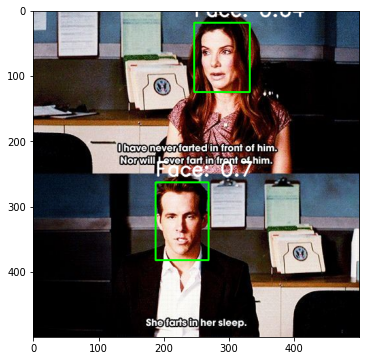

In [88]:
#Visualize on image
visualize_output('Prediction Image.jpeg', confidence_threshold=0.6)

Both the faces are detected with 69 and 63 percent confidence interval each

# PART -2 FACE RECOGNITION

#### Mount Google drive if you are using google colab
- We recommend using Google Colab as you can face memory issues and longer runtimes while running on local

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


#### Change current working directory to project folder. [ Score: 2 points ]

In [2]:
#Come to the home directory
%cd /content

/content


In [3]:
#Create a folder for your project e.g in this case, detection. You can choose any name for the folder 
!mkdir face_recognition

#Go to the project folder
%cd face_recognition

/content/face_recognition


#### Extract the zip file [ Score: 2 points ]
- Extract Aligned Face Dataset from Pinterest.zip

In [4]:
!sudo cp -v -r "/content/drive/MyDrive/Colab Notebooks/Part 3 - Aligned Face Dataset from Pinterest.zip" "/content/face_recognition/"

'/content/drive/MyDrive/Colab Notebooks/Part 3 - Aligned Face Dataset from Pinterest.zip' -> '/content/face_recognition/Part 3 - Aligned Face Dataset from Pinterest.zip'


In [5]:
project_path = "/content/face_recognition/"

In [6]:
images_zip_path = project_path + "Part 3 - Aligned Face Dataset from Pinterest.zip"

from zipfile import ZipFile

with ZipFile(images_zip_path, 'r') as z:
  z.extractall()

### Function to load images
- Define a function to load the images from the extracted folder and map each image with person id 


In [7]:
import numpy as np
import os

class IdentityMetadata():
    def __init__(self, base, name, file):
        # print(base, name, file)
        # dataset base directory
        self.base = base
        # identity name
        self.name = name
        # image file name
        self.file = file

    def __repr__(self):
        return self.image_path()

    def image_path(self):
        return os.path.join(self.base, self.name, self.file) 
    
def load_metadata(path):
    metadata = []
    for i in os.listdir(path):
        for f in os.listdir(os.path.join(path, i)):
            # Check file extension. Allow only jpg/jpeg' files.
            ext = os.path.splitext(f)[1]
            if ext == '.jpg' or ext == '.jpeg':
                metadata.append(IdentityMetadata(path, i, f))
    return np.array(metadata)

# metadata = load_metadata('images')
metadata = load_metadata('PINS')

In [8]:
metadata

array([PINS/pins_Rami Melek/Rami Melek20_1898.jpg,
       PINS/pins_Rami Melek/Rami Melek54_1886.jpg,
       PINS/pins_Rami Melek/Rami Melek23_1917.jpg, ...,
       PINS/pins_tom holland face/tom holland face114.jpg,
       PINS/pins_tom holland face/tom holland face35.jpg,
       PINS/pins_tom holland face/tom holland face7.jpg], dtype=object)

### Define function to load image
- Define a function to load image from the metadata

In [9]:
import cv2
def load_image(path):
    img = cv2.imread(path, 1)
    # OpenCV loads images with color channels
    # in BGR order. So we need to reverse them
    return img[...,::-1]

#### Load a sample image [ Score: 2 points ]
- Load one image using the function "load_image"

In [10]:
#Pickup a random image number
img_num = np.random.randint(0, metadata.shape[0])

#Read the image
img_file_path = metadata[img_num]
img = load_image(str(img_file_path))

In [11]:
import matplotlib.pyplot as plt

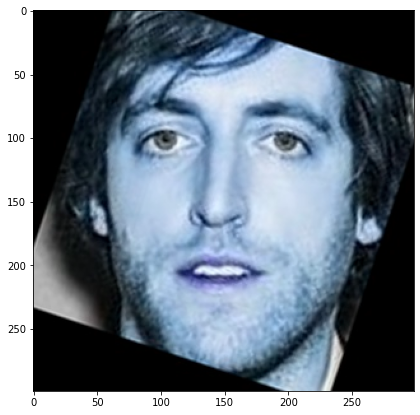

In [12]:
#Convert BGR format (used by opencv to RGB format used by matplotlib)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

#Draw image using matplotlib
plt.figure(figsize=(10,7))
plt.imshow(img)
plt.show()

### VGG Face model
- Here we are giving you the predefined model for VGG face

In [13]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import ZeroPadding2D, Convolution2D, MaxPooling2D, Dropout, Flatten, Activation

def vgg_face():	
    model = Sequential()
    model.add(ZeroPadding2D((1,1),input_shape=(224,224, 3)))
    model.add(Convolution2D(64, (3, 3), activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(64, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2,2), strides=(2,2)))
    
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(128, (3, 3), activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(128, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2,2), strides=(2,2)))
    
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(256, (3, 3), activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(256, (3, 3), activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(256, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2,2), strides=(2,2)))
    
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(512, (3, 3), activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(512, (3, 3), activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(512, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2,2), strides=(2,2)))
    
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(512, (3, 3), activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(512, (3, 3), activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(512, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2,2), strides=(2,2)))
    
    model.add(Convolution2D(4096, (7, 7), activation='relu'))
    model.add(Dropout(0.5))
    model.add(Convolution2D(4096, (1, 1), activation='relu'))
    model.add(Dropout(0.5))
    model.add(Convolution2D(2622, (1, 1)))
    model.add(Flatten())
    model.add(Activation('softmax'))
    return model

#### Load the model [ Score: 2 points ]
- Load the model defined above
- Then load the given weight file named "vgg_face_weights.h5"

In [14]:
!sudo cp -v -r "/content/drive/MyDrive/Colab Notebooks/Part 3 - vgg_face_weights.h5" "/content/face_recognition/"

'/content/drive/MyDrive/Colab Notebooks/Part 3 - vgg_face_weights.h5' -> '/content/face_recognition/Part 3 - vgg_face_weights.h5'


In [15]:
model = vgg_face()
vgg_model = "Part 3 - vgg_face_weights.h5"
model.load_weights(vgg_model)

### Get vgg_face_descriptor

In [16]:
from tensorflow.keras.models import Model
vgg_face_descriptor = Model(inputs=model.layers[0].input, outputs=model.layers[-2].output)

### Generate embeddings for each image in the dataset
- Given below is an example to load the first image in the metadata and get its embedding vector from the pre-trained model. 

In [17]:
# Get embedding vector for first image in the metadata using the pre-trained model

img_path = metadata[0].image_path()
img = load_image(img_path)

# Normalising pixel values from [0-255] to [0-1]: scale RGB values to interval [0,1]
img = (img / 255.).astype(np.float32)

img = cv2.resize(img, dsize = (224,224))
print(img.shape)

# Obtain embedding vector for an image
# Get the embedding vector for the above image using vgg_face_descriptor model and print the shape 

embedding_vector = vgg_face_descriptor.predict(np.expand_dims(img, axis=0))[0]
print(embedding_vector.shape)

(224, 224, 3)
(2622,)


#### Generate embeddings for all images  [ Score: 3 points ]
- Write code to iterate through metadata and create embeddings for each image using `vgg_face_descriptor.predict()` and store in a list with name `embeddings`

- If there is any error in reading any image in the dataset, fill the emebdding vector of that image with 2622-zeroes as the final embedding from the model is of length 2622.

In [18]:
embeddings = np.zeros((metadata.shape[0], 2622))

for i, m in enumerate(metadata):

  img_path = metadata[i].image_path()
  img = load_image(img_path)

  # # Normalising pixel values from [0-255] to [0-1]: scale RGB values to interval [0,1]
  img = (img / 255.).astype(np.float32)

  img = cv2.resize(img, dsize = (224,224))
  # print(img.shape)

  # Obtain embedding vector for an image
  # Get the embedding vector for the above image using vgg_face_descriptor model and print the shape 

  embedding_vector = vgg_face_descriptor.predict(np.expand_dims(img, axis=0))[0]
  embeddings[i] = embedding_vector
  #### Add your code here ####

### Function to calculate distance between given 2 pairs of images.

- Consider distance metric as "Squared L2 distance"
- Squared l2 distance between 2 points (x1, y1) and (x2, y2) = (x1-x2)^2 + (y1-y2)^2

In [19]:
def distance(emb1, emb2):
    return np.sum(np.square(emb1 - emb2))

#### Plot images and get distance between the pairs given below
- 2, 3 and 2, 180
- 30, 31 and 30, 100
- 70, 72 and 70, 115

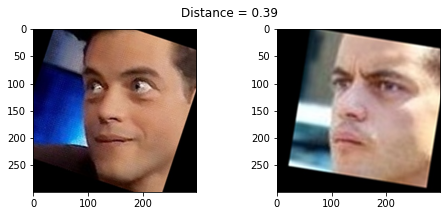

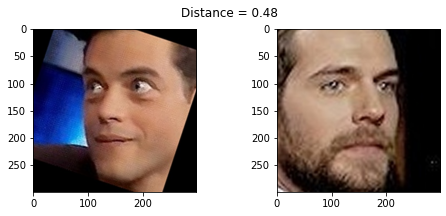

In [20]:
import matplotlib.pyplot as plt

def show_pair(idx1, idx2):
    plt.figure(figsize=(8,3))
    plt.suptitle(f'Distance = {distance(embeddings[idx1], embeddings[idx2]):.2f}')
    plt.subplot(121)
    plt.imshow(load_image(metadata[idx1].image_path()))
    plt.subplot(122)
    plt.imshow(load_image(metadata[idx2].image_path()));    

show_pair(2, 3)
show_pair(2, 180)

#### Standardize the feature values [ Score: 2 points ]
- Scale the features using StandardScaler

In [21]:
X = embeddings

In [22]:
# Standarize features
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
Xscaled = scaler.fit_transform(X)

#### Reduce dimensions using PCA (3 marks)
- Reduce feature dimensions using Principal Component Analysis
- Set the parameter n_components=128

In [23]:
from sklearn.decomposition import PCA

pca = PCA(n_components=128)
pca.fit(Xscaled)
print(pca.explained_variance_)
print(pca.components_)
print(pca.explained_variance_ratio_)

[356.06384849 141.15457584 104.19536263  96.45190535  89.11578215
  82.39982979  67.54066089  61.60817447  55.00835303  50.71097681
  47.70883322  44.79356791  43.47293483  41.01003078  37.3439589
  35.81947946  34.30201368  32.05052391  30.19365529  29.81933212
  28.66999808  27.73257802  25.20306788  24.6497386   23.830761
  23.15351458  21.95305225  20.10124474  19.96817113  19.24943781
  18.32835316  17.3815156   16.56238162  16.36765912  14.89102147
  14.08782238  13.87811998  13.49904848  13.19058974  12.75465078
  11.6088173   11.3318101   10.42216931  10.29119385   9.70571167
   9.29006579   8.99541036   8.76326826   8.5934319    8.34944057
   8.22290642   8.06638603   7.60508451   7.38356793   7.28174368
   7.16873642   7.05052063   6.85805242   6.61701004   6.54691467
   6.23184933   6.0579439    5.88825778   5.68444619   5.54552334
   5.38220286   5.28088024   5.07796604   4.95433225   4.80071039
   4.78617344   4.68224413   4.60191588   4.52003034   4.4276957
   4.33528806 

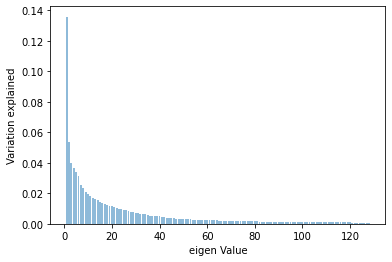

In [24]:
plt.bar(list(range(1,129)),pca.explained_variance_ratio_,alpha=0.5, align='center')
plt.ylabel('Variation explained')
plt.xlabel('eigen Value')
plt.show()

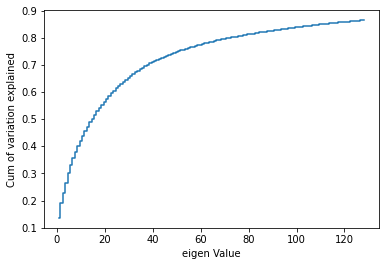

In [25]:
plt.step(list(range(1,129)),np.cumsum(pca.explained_variance_ratio_), where='mid')
plt.ylabel('Cum of variation explained')
plt.xlabel('eigen Value')
plt.show()

In [26]:
Xpca = pca.transform(Xscaled)

In [27]:
Xpca.shape

(10770, 128)

#### Create train and test sets [ Score: 2 points ]
- Create X_train, X_test and y_train, y_test
- Use train_idx to seperate out training features and labels
- Use test_idx to seperate out testing features and labels

In [28]:
train_idx = np.arange(Xpca.shape[0]) % 9 != 0     #every 9th example goes in test data and rest go in train data
test_idx = np.arange(Xpca.shape[0]) % 9 == 0

# one half as train examples of 10 identities
X_train = Xpca[train_idx]
# another half as test examples of 10 identities
X_test = Xpca[test_idx]

targets = np.array([m.name for m in metadata])
#train labels
y_train = targets[train_idx]
#test labels
y_test = targets[test_idx]

In [29]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(9573, 128)
(1197, 128)
(9573,)
(1197,)


#### Encode the Labels  [ Score: 2 points ]
- Encode the targets
- Use LabelEncoder

In [30]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
y_train = le.fit_transform(y_train)
y_test = le.fit_transform(y_test)

#### Build a Classifier (3 marks)
- Use SVM Classifier to predict the person in the given image
- Fit the classifier and print the score

In [31]:
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV

In [32]:
targets = np.array([m.name for m in metadata])
y = le.fit_transform(targets)

In [34]:
from sklearn import svm

In [35]:
model = svm.SVC()
kernel = ['poly', 'rbf', 'sigmoid']
C = [50, 10, 1.0, 0.1, 0.01]
gamma = ['scale']
# define grid search
grid = dict(kernel=kernel,C=C,gamma=gamma)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)
grid_result = grid_search.fit(Xpca, y)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.963417 using {'C': 1.0, 'gamma': 'scale', 'kernel': 'rbf'}
0.952863 (0.004958) with: {'C': 50, 'gamma': 'scale', 'kernel': 'poly'}
0.962767 (0.004078) with: {'C': 50, 'gamma': 'scale', 'kernel': 'rbf'}
0.911885 (0.006434) with: {'C': 50, 'gamma': 'scale', 'kernel': 'sigmoid'}
0.952089 (0.004975) with: {'C': 10, 'gamma': 'scale', 'kernel': 'poly'}
0.962767 (0.004078) with: {'C': 10, 'gamma': 'scale', 'kernel': 'rbf'}
0.933179 (0.006576) with: {'C': 10, 'gamma': 'scale', 'kernel': 'sigmoid'}
0.927391 (0.006258) with: {'C': 1.0, 'gamma': 'scale', 'kernel': 'poly'}
0.963417 (0.004157) with: {'C': 1.0, 'gamma': 'scale', 'kernel': 'rbf'}
0.959579 (0.004763) with: {'C': 1.0, 'gamma': 'scale', 'kernel': 'sigmoid'}
0.705757 (0.011719) with: {'C': 0.1, 'gamma': 'scale', 'kernel': 'poly'}
0.922748 (0.007324) with: {'C': 0.1, 'gamma': 'scale', 'kernel': 'rbf'}
0.934045 (0.005899) with: {'C': 0.1, 'gamma': 'scale', 'kernel': 'sigmoid'}
0.061127 (0.006051) with: {'C': 0.01, 'gamma': 'scale',

In [36]:
from sklearn.svm import SVC

# Fit the model on train
model = SVC(gamma ='scale', C=1.0, kernel = 'rbf')
model.fit(X_train, y_train)
#predict on test
y_predict = model.predict(X_test)

In [37]:
model_score = model.score(X_test, y_test)
print(model_score)

0.9699248120300752


#### Test results (2 marks)
- Take 10th image from test set and plot the image
- Report to which person(folder name in dataset) the image belongs to

In [38]:
test_embedding = np.zeros((1, 2622))
test_embedding

array([[0., 0., 0., ..., 0., 0., 0.]])

In [39]:
import warnings
# Suppress LabelEncoder warning
warnings.filterwarnings('ignore')

example_idx = 10

example_image = load_image(metadata[test_idx][example_idx].image_path())

# Normalising pixel values from [0-255] to [0-1]: scale RGB values to interval [0,1]
img = (example_image / 255.).astype(np.float32)

img = cv2.resize(img, dsize = (224,224))
print(img.shape)

# Obtain embedding vector for an image
# Get the embedding vector for the above image using vgg_face_descriptor model and print the shape 

ev_test = vgg_face_descriptor.predict(np.expand_dims(img, axis=0))[0]
test_embedding[0] = ev_test
print(test_embedding.shape)

(224, 224, 3)
(1, 2622)


In [40]:
Xtest_scaled = scaler.fit_transform(test_embedding)
Xtest_scaled.shape

(1, 2622)

In [41]:
Xpca_test = pca.transform(Xtest_scaled)

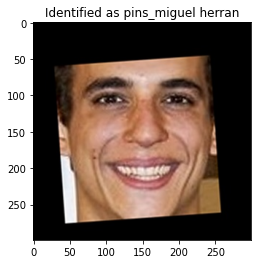

In [42]:
example_prediction = model.predict(Xpca_test)
example_identity = le.inverse_transform(example_prediction)[0]

plt.imshow(example_image)
plt.title(f'Identified as {example_identity}');

The model rightly classified the pin as the correct actor name and model has an accuracy of 96%